<a href="https://colab.research.google.com/github/Qu1ck5h0t/Grade10_PersonalProject/blob/main/trading_bot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import requests
import json
import matplotlib.pyplot as plt
import time
from datetime import datetime, timedelta

In [ ]:
import matplotlib.pyplot as plt

import matplotlib as mpl
from matplotlib import cycler
colors = cycler('color',
                ['#669FEE', '#66EE91', '#9988DD',
                 '#EECC55', '#88BB44', '#FFBBBB'])
plt.rc('figure', facecolor='#313233')
plt.rc('axes', facecolor="#313233", edgecolor='none',
       axisbelow=True, grid=True, prop_cycle=colors,
       labelcolor='gray')
plt.rc('grid', color='474A4A', linestyle='solid')
plt.rc('xtick', color='gray')
plt.rc('ytick', direction='out', color='gray')
plt.rc('legend', facecolor="#313233", edgecolor="#313233")
plt.rc("text", color="#C9C9C9")

In [ ]:
def df_update():
  url = f'https://api.kraken.com/0/public/OHLC?pair=XBTUSD&interval=1'

  response = requests.get(url)
  data = response.json()
  btcusd = data["result"]["XXBTZUSD"]

  df = pd.DataFrame(btcusd)
  df.columns = ["time", "open", "high", "low", "close", "vwap", "volume", "count"]
  del df["vwap"]
  del df["volume"]
  del df["count"]
  df["time"] = pd.to_datetime(df["time"], unit='s')
  df.set_index("time", inplace=True)
  return df
df = df_update()
df_update()

,open,high,low,close
time,,,,
2024-05-14 02:01:00,62628.2,62662.1,62628.2,62662.1
2024-05-14 02:02:00,62665.7,62665.7,62665.7,62665.7
2024-05-14 02:03:00,62665.7,62665.7,62635.9,62644.8
2024-05-14 02:04:00,62637.8,62637.8,62637.8,62637.8
2024-05-14 02:05:00,62629.6,62629.6,62494.0,62509.3
...,...,...,...,...
2024-05-14 13:56:00,61718.4,61747.8,61716.4,61747.8
2024-05-14 13:57:00,61747.7,61747.7,61738.7,61738.7
2024-05-14 13:58:00,61738.7,61738.8,61738.7,61738.8


<Axes: xlabel='time'>

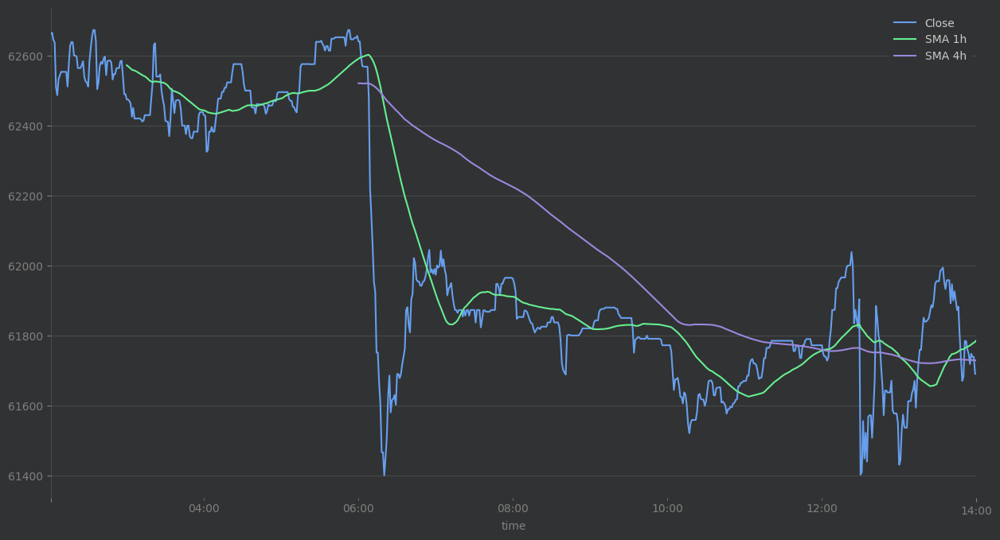

In [ ]:

df["SMA 1h"] = df["close"].rolling(60).mean()

df["SMA 4h"] = df["close"].rolling(240).mean()

df["Close"] = df["close"].rolling(1).mean()

df[["Close", "SMA 1h", "SMA 4h"]].plot(figsize=(15, 8))

In [ ]:
condition_buy = (df["SMA 1h"] > df["SMA 4h"]) & (df["SMA 1h"].shift(1) < df["SMA 4h"].shift(1))
condition_sell = (df["SMA 1h"] < df["SMA 4h"]) & (df["SMA 1h"].shift(1) > df["SMA 4h"].shift(1))

def signal():
  #condition to buy
  if condition_buy.iloc[-1]:
    print(f"{df.index[-1]}: Open long at price {df.iloc[-1]['close']}")
  #condition to sell
  if condition_sell.iloc[-1]:
    print(f"{df.index[-1]}: Open short at price {df.iloc[-1]['close']}")

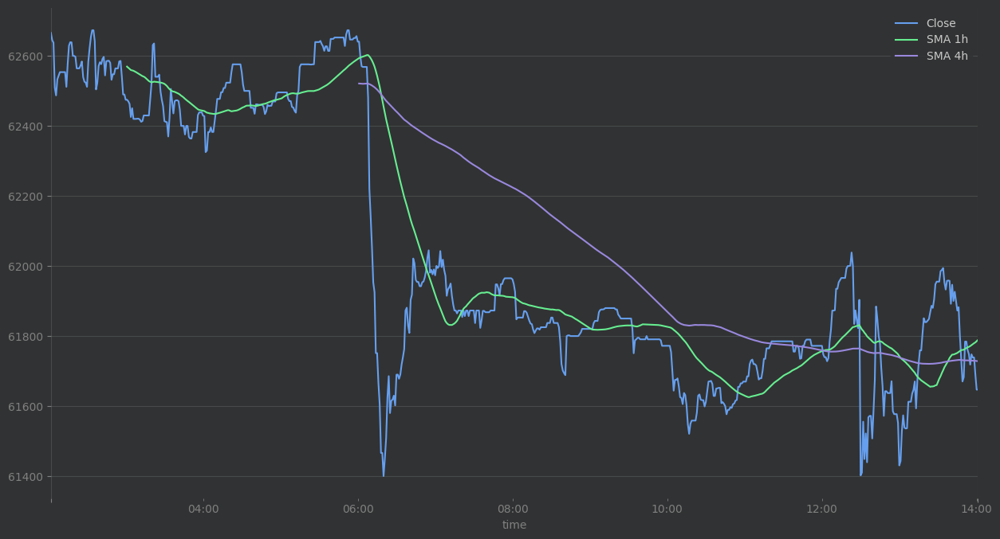

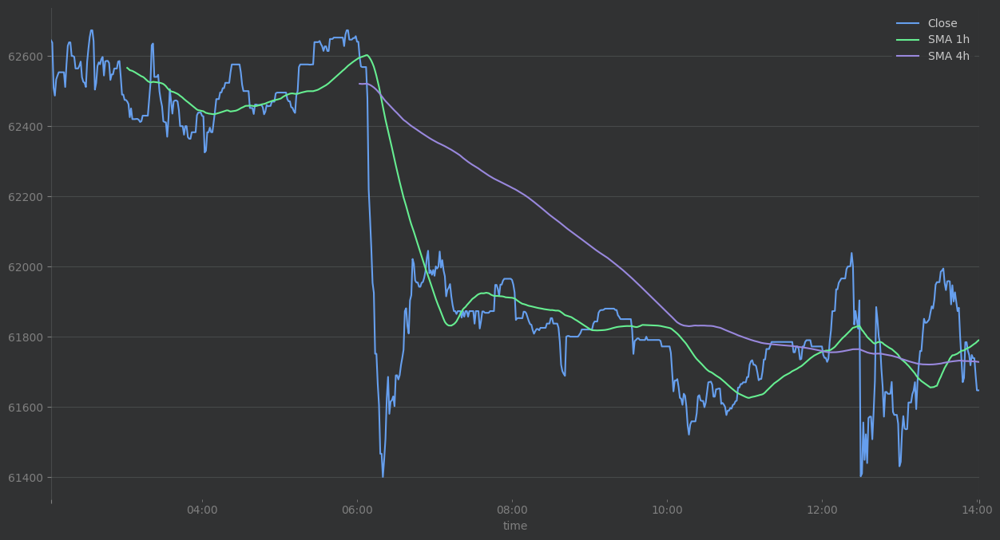

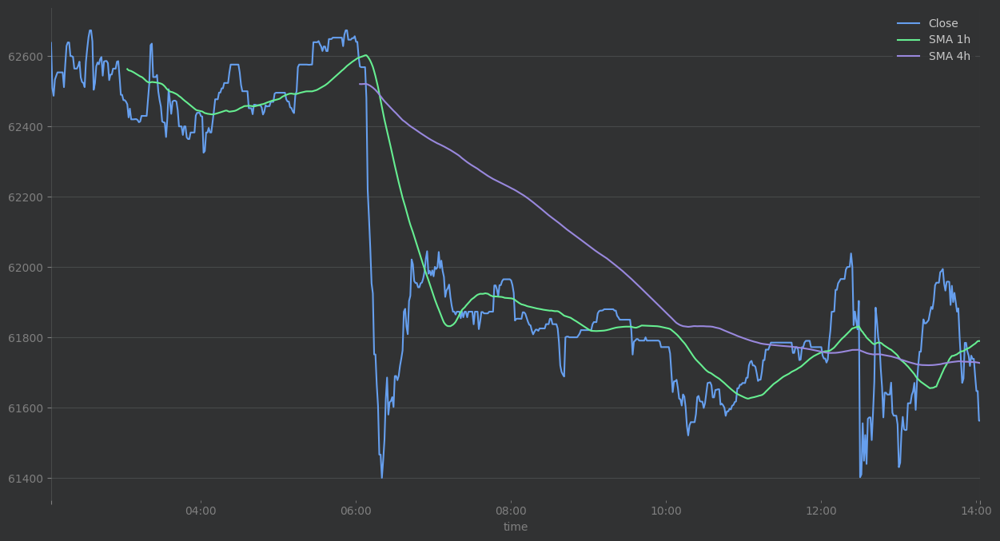

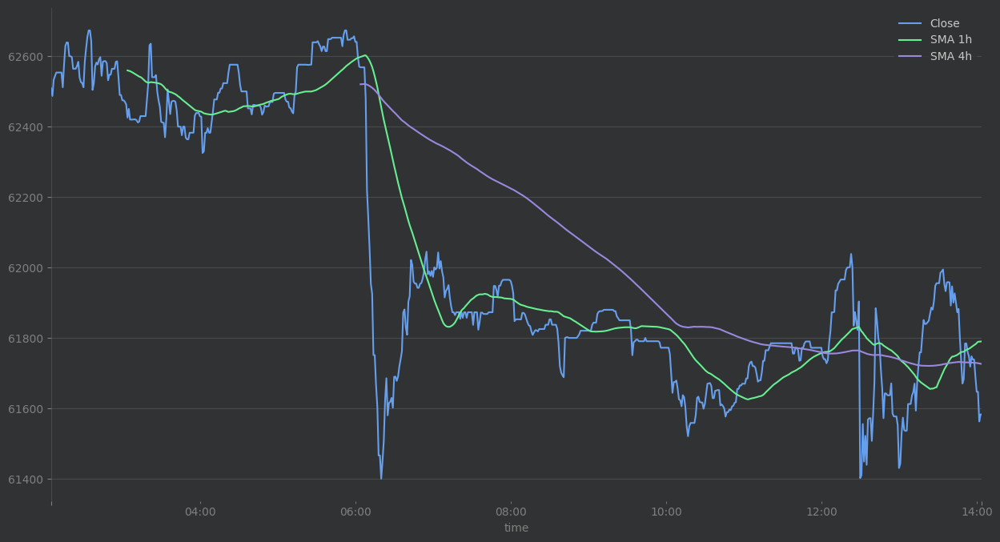

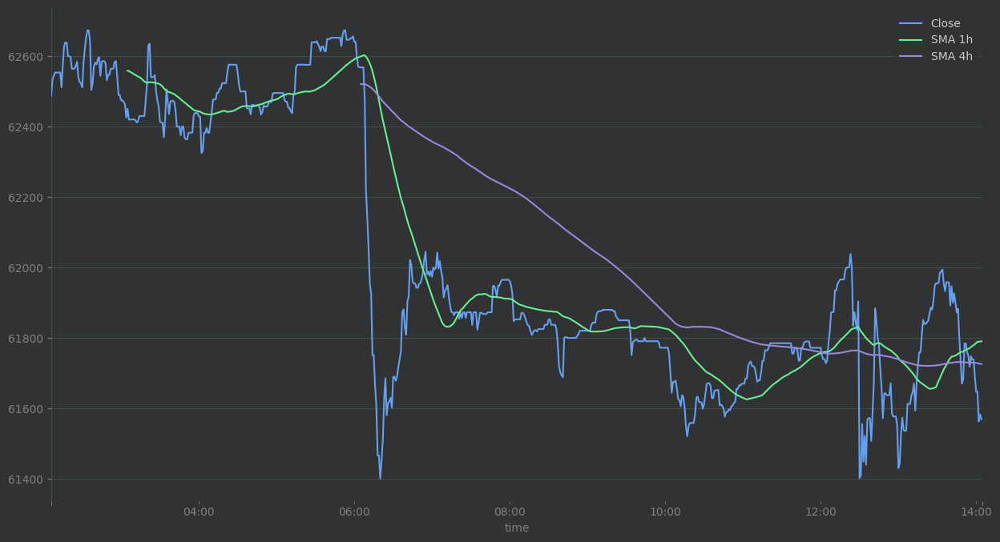

...

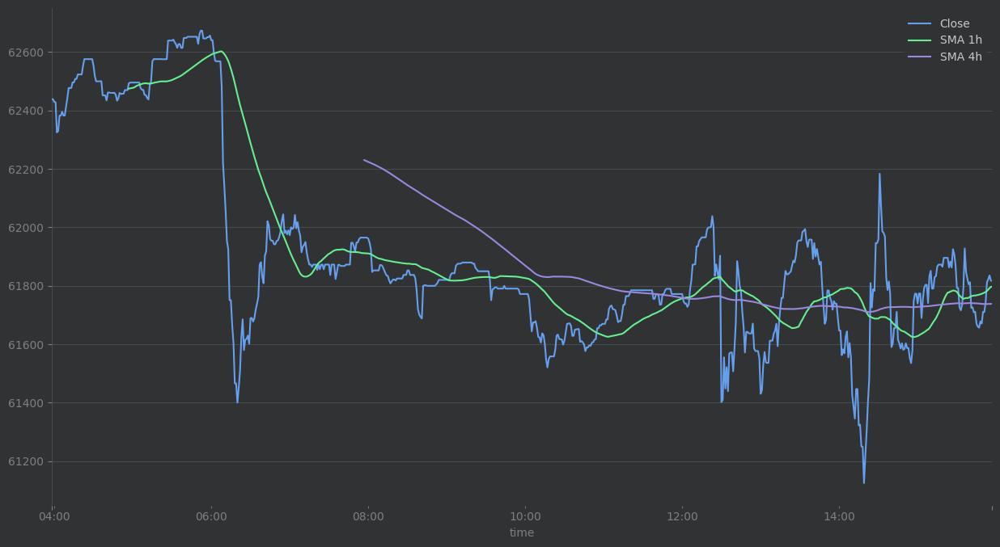

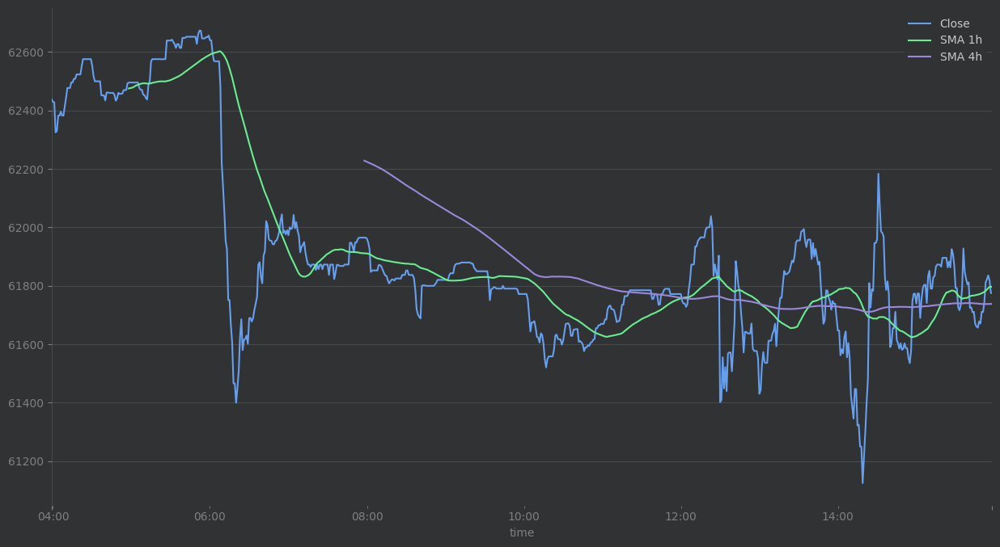

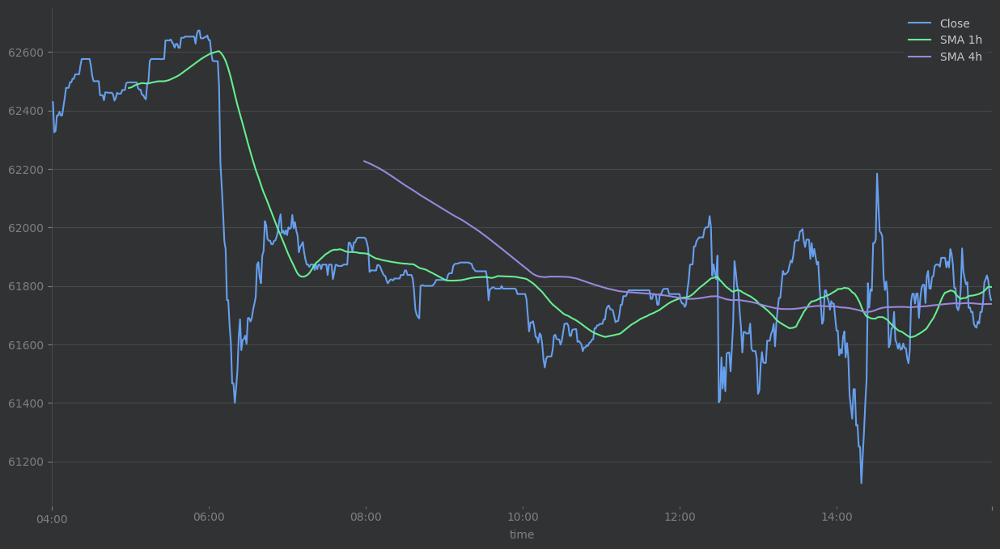

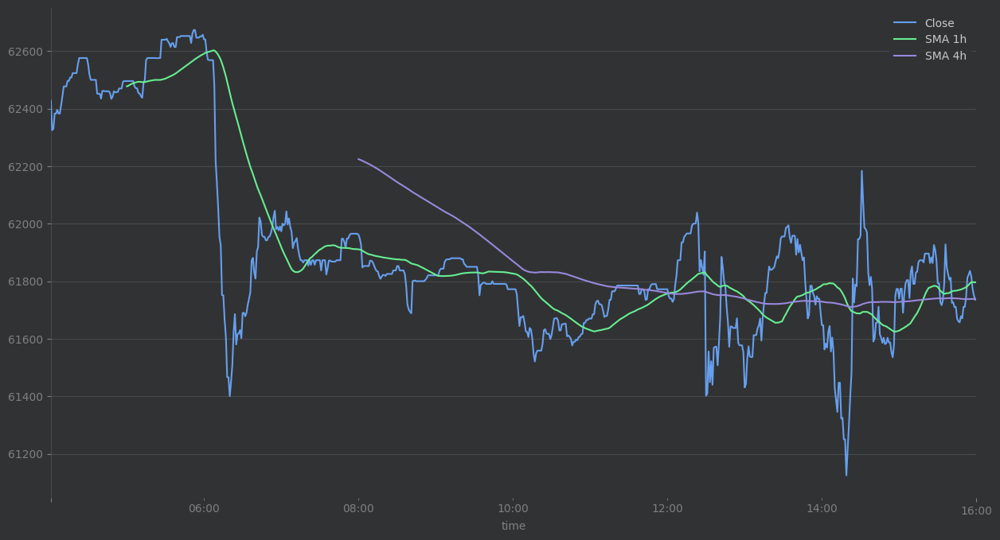

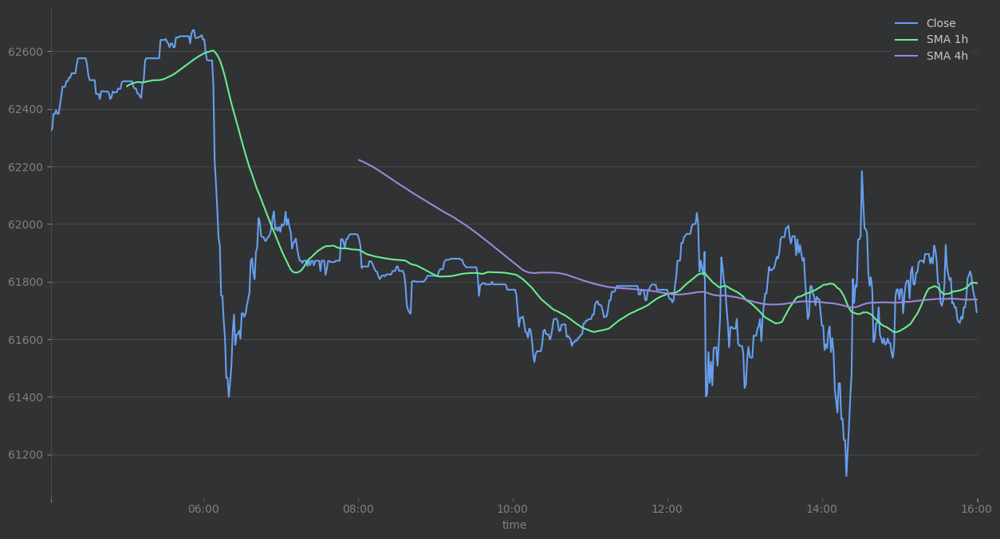

In [ ]:
current_time = datetime.now()
time.sleep(60 - current_time.second)
while True:
  df = df_update()
  df_update()
  plt.close('all')
  time.sleep(5)
  df["SMA 1h"] = df["close"].rolling(60).mean()
  df["SMA 4h"] = df["close"].rolling(240).mean()
  df["Close"] = df["close"].rolling(1).mean()
  df[["Close", "SMA 1h", "SMA 4h"]].plot(figsize=(15, 8))
  plt.show(block=False)
  signal()
  current_time = datetime.now()
  time.sleep(60 - current_time.second)